In [38]:
import loompy
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import os
import numpy_groupies as npg
from scipy import sparse
import seaborn
import matplotlib as mpl
import gget
import pickle
import tomotopy as tt
from scipy.cluster import hierarchy as hc

# suppress INFO
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

# make font changeable in Illustrator
mpl.rcParams['pdf.fonttype'] = 42

# save figure with no pad
mpl.rcParams['savefig.pad_inches'] = 0
mpl.rcParams['savefig.bbox'] = 'tight'

# set axes width
mpl.rcParams['axes.linewidth'] = 0.2
mpl.rcParams['xtick.minor.pad'] = 0
mpl.rcParams['xtick.major.pad'] = 0
mpl.rcParams['ytick.minor.pad'] = 0
mpl.rcParams['ytick.major.pad'] = 0
mpl.rcParams['xtick.minor.width'] = 0.2
mpl.rcParams['xtick.major.width'] = 0.2
mpl.rcParams['ytick.minor.width'] = 0.2
mpl.rcParams['ytick.major.width'] = 0.2

# use colorblind seaborn style
plt.style.use('seaborn-colorblind')

# colors for ROI Groups
color_dict = dict(
    zip(
        ["Cerebral cortex", "Hippocampus", "Cerebral nuclei", "Hypothalamus", "Thalamus", "Midbrain", "Pons", "Cerebellum", "Myelencephalon", "Spinal cord"],
        ['#4682f0', '#8eb7d1', '#89d8e0', '#f28e37', '#e7bc1f', '#43ad78', '#a7236e', '#ed5f8e', '#955ba5', '#eec2a4']
    )
)

In [39]:
folder = '/proj/human_adult/20220222/harmony/paris_top_bug/data/'
figure_folder = '/home/kimberly/figures/figure6/'

In [40]:
# get ncRNA gene names
with loompy.connect(f'{folder}/Pool.loom', 'r') as ds:
    accession_dict = dict(zip(
        pd.Series(ds.ra.Accession).str.split('.').str[0],
        np.arange(ds.shape[0])
    ))
    ncRNA_genes = np.loadtxt('ncRNA.txt', dtype='object')
    accession_ix = np.array([accession_dict.get(x, '') for x in ncRNA_genes])
    accession_ix = accession_ix[accession_ix != ''].astype('int')
    ncRNA_genes = ds.ra.Gene[accession_ix]

In [41]:
cbl = seaborn.color_palette('colorblind')
cbl

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

In [76]:
def go_plot(table, n_top=25, filename=None):
    
    top = table.sort_values('adj_p_val')[:n_top][::-1]
    
    plt.figure(None, (1, 3))
    
    ax = plt.subplot(122)
    plt.barh(range(n_top), top['adj_p_val'].to_numpy(), color='grey', alpha=0.3)
    plt.vlines(0.05, -0.5, n_top-0.5, linestyles='dashed', colors=cbl[2])
    # ax.spines.right.set_visible(False)
    # ax.spines.top.set_visible(False)
    plt.yticks([])
    plt.xticks(np.round(np.linspace(0, top['adj_p_val'].max(), 4), 2), rotation=90, fontsize=7)
    plt.margins(y=0.01)
    
    ax = plt.subplot(121)
    n_genes = top['overlapping_genes'].str.len().to_numpy()
    plt.barh(range(n_top), -n_genes, alpha=0.3, color='grey')
    # ax.spines.left.set_visible(False)
    # ax.spines.top.set_visible(False)
    plt.yticks(range(n_top), top['path_name'].str.split('(').str[0].str.strip(), fontsize=9)
    plt.xticks(
        -np.linspace(0, n_genes.max(), 4),
        np.round(np.linspace(0, n_genes.max(), 4), 2),
        rotation=90,
        fontsize=7
    )
    plt.margins(y=0.01)
    if filename:
        plt.savefig(filename, dpi=300)
    else:
        plt.show()

# Two topics

In [43]:
k = 2
model = tt.LDAModel.load(f'/proj/human_adult/20220222/harmony/analysis/LDA/astrocytes/{k}/model.bin')
cells = np.loadtxt(f'/proj/human_adult/20220222/harmony/analysis/LDA/astrocytes/{k}/cells.txt').astype('int')
transformed = np.vstack([doc.get_topic_dist() for doc in model.docs])
transformed.shape

(155025, 2)

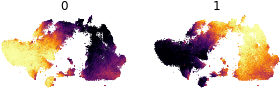

In [44]:
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:

    plt.figure(None, (16, 16))
    gs = plt.GridSpec(6, 6)

    xy = ds.ca.TSNE[cells]
    
    for i in range(k):
        ax = plt.subplot(gs[i])
        plt.scatter(xy[:, 0], xy[:, 1], c=transformed[:, i], s=0.5, lw=0, rasterized=True, cmap='inferno_r')
        plt.axis('off')
        ax.set_aspect('equal')
        plt.title(i)
        plt.margins(0.01, 0.01)

In [45]:
topics = np.vstack([model.get_topic_word_dist(i, normalize=False) for i in range(k)])
total_per_gene = topics.sum(axis=0)
normed_topics = topics / total_per_gene

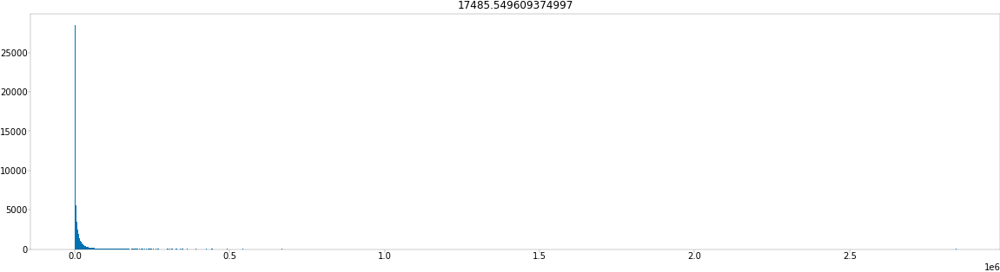

In [46]:
plt.figure(None, (20, 5))
plt.hist(topics.flatten(), bins=1000)
plt.title(np.percentile(topics.flatten(), 85))
plt.show()

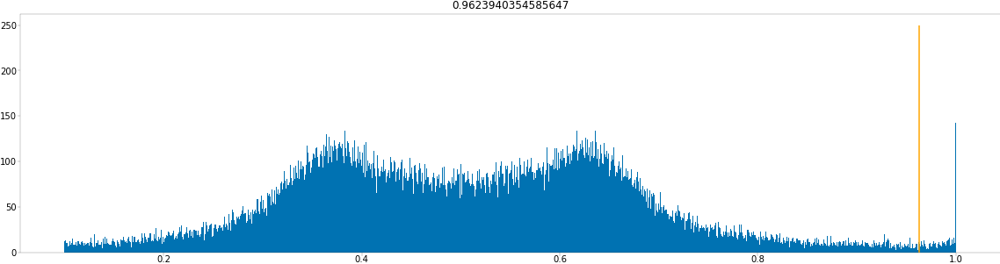

In [47]:
plt.figure(None, (20, 5))
plt.hist(normed_topics.flatten(), bins=1000, range=(0.1, 1))
plt.vlines(np.percentile(normed_topics.flatten(), 99), 0, 250, color='orange')
plt.title(np.percentile(normed_topics.flatten(), 99))
plt.show()

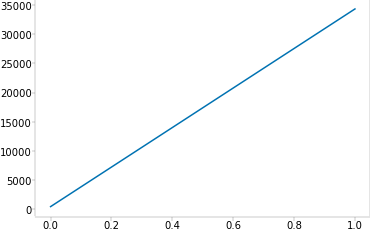

In [48]:
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:

    g = 'SLC13A5'
    ix_dict = dict(zip(ds.ra.Accession, np.arange(ds.shape[0])))
    ix = np.array([ix_dict.get(x) for x in list(model.vocabs)])
    plt.plot(topics[:, ds.ra.Gene[ix] == g])

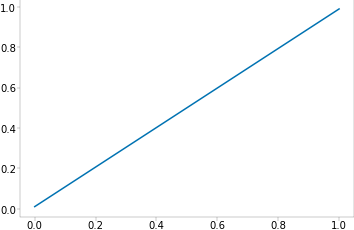

In [49]:
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:

    ix_dict = dict(zip(ds.ra.Accession, np.arange(ds.shape[0])))
    ix = np.array([ix_dict.get(x) for x in list(model.vocabs)])
    plt.plot(normed_topics[:, ds.ra.Gene[ix] == g])

In [50]:
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:

    k = topics.shape[0]
    accessions = ds.ra.Accession
    accession_dict = dict(zip(accessions, range(ds.shape[0]))) 
    
    filtered_top_genes = {}
    for n in range(k):
        # only keep genes that are > ? and > ? normed
        selected = (normed_topics[n] > 0.99) & (topics[n] > 10000) 
        print(selected.sum())
        filtered_topics = topics[n, selected]
        ix = np.array([accession_dict.get(x) for x in list(model.vocabs)])
        filtered_genes = ds.ra.Gene[ix][selected]
        filtered_top_genes[n] = filtered_genes[filtered_topics.argsort()[::-1]]

46
31



### TOPIC 0 ###



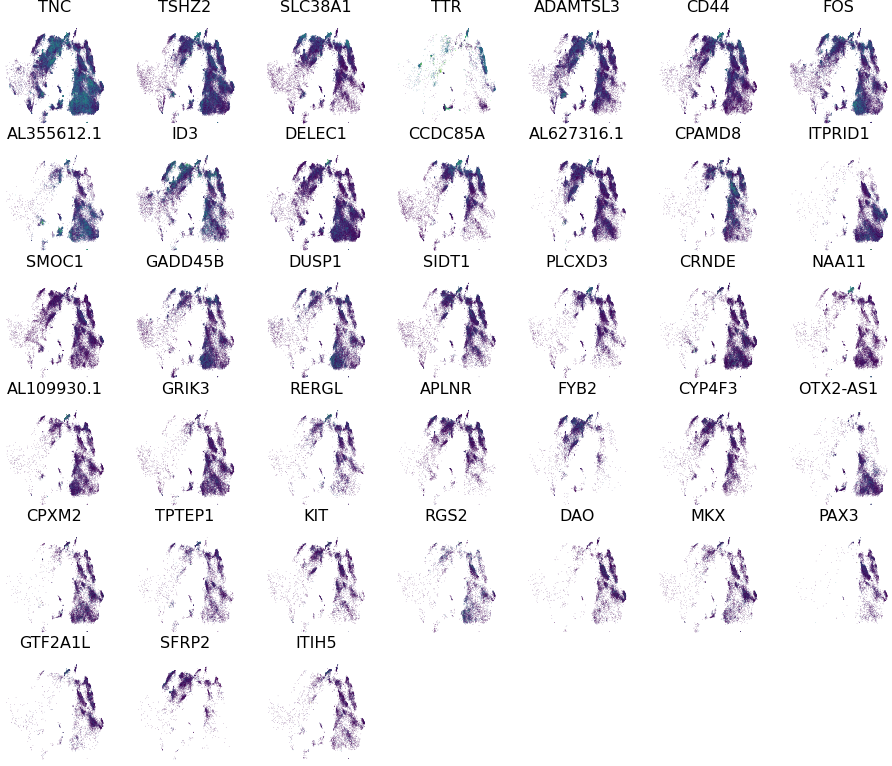


### TOPIC 1 ###



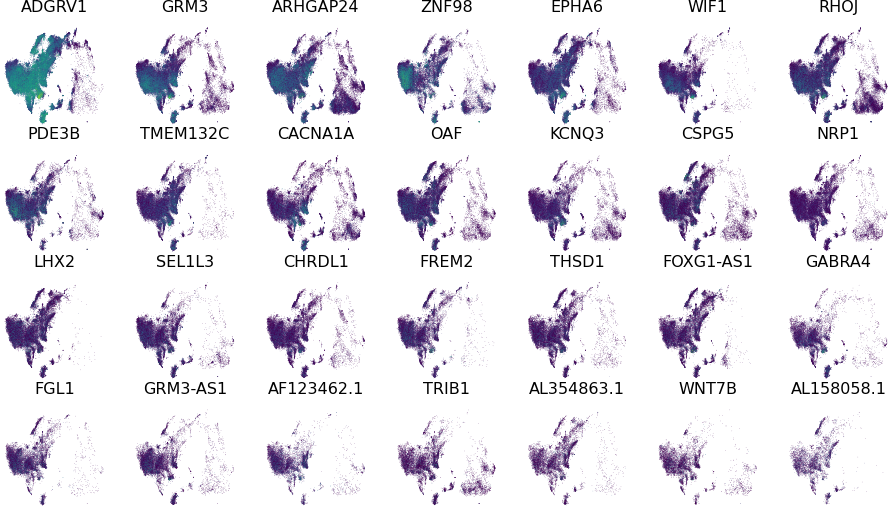

In [51]:
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:

    for n in range(k):
        
        print(f'\n### TOPIC {n} ###\n')
    
        plt.figure(None, (8, 8), dpi=144, facecolor='white')
        gs = plt.GridSpec(7, 7)
    
        nc = pd.Series(filtered_top_genes[n][:49]).str.startswith(('AC0', 'LINC')).to_numpy()
        to_plot = filtered_top_genes[n][:49][~nc]

        for i, g in enumerate(to_plot):
            plt.subplot(gs[i])
            exp = np.log(ds[np.where(ds.ra.Gene == g)[0][0], :].flatten() + 1)
            exp_cells = exp > 0
            plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], color='grey', alpha=0.01, s=0.05, lw=0, rasterized=True)
            plt.scatter(ds.ca.TSNE[exp_cells, 0], ds.ca.TSNE[exp_cells, 1], c=exp[exp_cells], s=0.05, lw=0, rasterized=True)
            plt.axis('off')
            plt.title(g, fontsize=8)
            plt.margins(0.05, 0.05)
            
        plt.show()

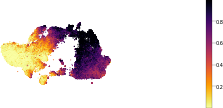

In [54]:
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:
                
    plt.figure(None, (4, 2))
    
    ax = plt.subplot(121)
    
    xy = ds.ca.TSNE[cells]
    plt.scatter(xy[:, 0], xy[:, 1], c=transformed[:, 0], s=1, lw=0, rasterized=True, cmap='inferno_r')

    ax.set_aspect('equal')
    plt.margins(0.01, 0.01)
    plt.axis('off')

    ax = plt.subplot(122)
    plt.axis('off')
    cbar = plt.colorbar(ax=ax)
    cbar.ax.tick_params(labelsize=5)
    
    plt.subplots_adjust(wspace=0, hspace=0)

    plt.savefig(f'{figure_folder}/topics_whitematter.pdf', dpi=300)
    

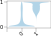

In [55]:
cells = np.loadtxt(f'/proj/human_adult/20220222/harmony/analysis/LDA/astrocytes/{k}/cells.txt').astype('int')

with loompy.connect('/proj/human_adult/20220222/harmony/paris_top_bug/data/harmony_B_C_Clean.agg.loom', 'r') as ds:
       clade = hc.cut_tree(ds.attrs.linkage, 2).flatten()

with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:
    
        plt.figure(None, (0.8, 0.5))
        
        labels = clade[ds.ca.Clusters]
        data = [transformed[:, 0][labels == x] for x in [0, 1]]
        
        plt.violinplot(data, showextrema=False, widths=1.8)
        plt.xticks(range(len(data) + 1), [''] + list(np.unique(labels)), rotation=45, fontsize=5)
        plt.yticks(fontsize=5)
        plt.savefig(f'{figure_folder}/topics_whitematter_type.pdf', dpi=300)
        

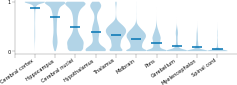

In [58]:
plt.figure(None, (4, 1))

with loompy.connect('/proj/human_adult/20220222/harmony/paris_top_bug/data/Pool.loom', 'r') as ds:
    cell_dict = dict(zip(ds.ca.CellID, ds.ca.ROIGroupCoarse))
    
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:
        
        labels = np.array([cell_dict.get(x) for x in ds.ca.CellID])
        data = [transformed[:, 1][labels == x] for x in list(color_dict.keys())]
        
plt.violinplot(data, showmeans=True, showextrema=False, widths=1)
plt.xticks(range(len(data) + 1), [''] + list(color_dict.keys()), rotation=35, ha='right', fontsize=5)
plt.yticks(fontsize=5)
plt.savefig(f'{figure_folder}/topics_whitematter_type_region.pdf', dpi=300)


## 30 topics

In [59]:
k = 30
model = tt.LDAModel.load(f'/proj/human_adult/20220222/harmony/analysis/LDA/astrocytes/{k}/model.bin')
cells = np.loadtxt(f'/proj/human_adult/20220222/harmony/analysis/LDA/astrocytes/{k}/cells.txt').astype('int')
transformed = np.vstack([doc.get_topic_dist() for doc in model.docs])
transformed.shape

(155025, 30)

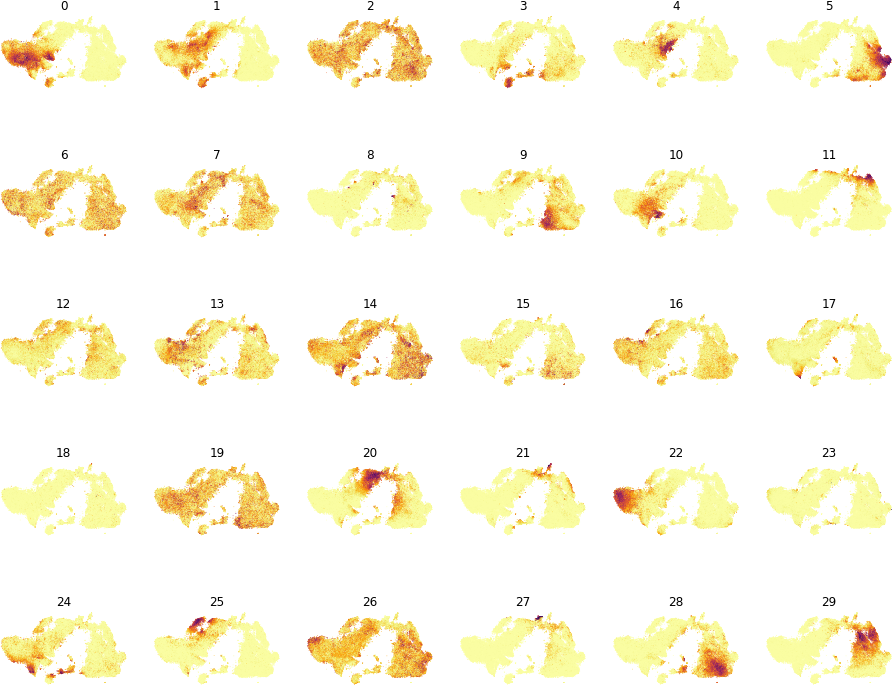

In [60]:
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:

    plt.figure(None, (16, 16))
    gs = plt.GridSpec(6, 6)

    xy = ds.ca.TSNE[cells]
    
    for i in range(k):
        ax = plt.subplot(gs[i])
        plt.scatter(xy[:, 0], xy[:, 1], c=transformed[:, i], s=0.5, lw=0, rasterized=True, cmap='inferno_r')
        plt.axis('off')
        ax.set_aspect('equal')
        plt.title(i)
        plt.margins(0.01, 0.01)

['H18.30.001' 'H18.30.002' 'H19.30.001' 'H19.30.002']


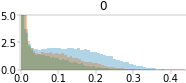

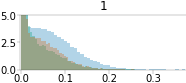

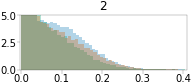

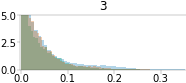

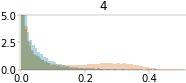

...

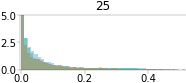

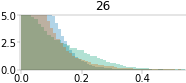

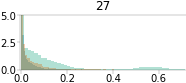

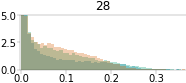

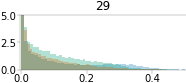

In [61]:
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:
    
    print(np.unique(ds.ca.Donor))
    
    for i in range(k):
        plt.figure(None, (3, 1))
        for donor in np.unique(ds.ca.Donor)[1:]:
            vals = transformed[:, i][ds.ca.Donor[cells] == donor].flatten()
            plt.hist(vals, bins=50, alpha=0.3, density=True)
            plt.ylim(0, 5)
        plt.title(i)
        plt.margins(0.01, 0.01)
        plt.show()

In [62]:
color_dict = dict(
    zip(
        ["Cerebral cortex", "Hippocampus", "Cerebral nuclei", "Hypothalamus", "Thalamus", "Midbrain", "Pons", "Cerebellum", "Myelencephalon", "Spinal cord"],
        ['#4682f0', '#8eb7d1', '#89d8e0', '#f28e37', '#e7bc1f', '#43ad78', '#a7236e', '#ed5f8e', '#955ba5', '#eec2a4']
    )
)

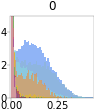

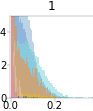

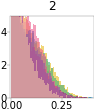

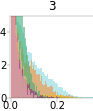

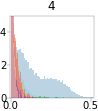

...

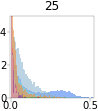

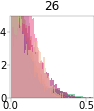

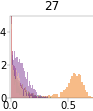

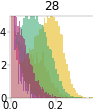

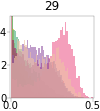

In [63]:
with loompy.connect('/proj/human_adult/20220222/harmony/paris_top_bug/data/Pool.loom', 'r') as ds:
    cell_dict = dict(zip(ds.ca.CellID, ds.ca.ROIGroupCoarse))
    
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:
    
    labels = np.array([cell_dict.get(x) for x in ds.ca.CellID])
    
    for n in range(k):
        plt.figure(None, (1.5, 1.5))
        for i, r in enumerate(list(color_dict.keys())):
            vals = transformed[:, n][labels[cells] == r].flatten()
            plt.hist(vals, bins=50, alpha=0.6, density=True, color=color_dict[r])
            plt.ylim(0, 5)
        plt.title(n)
        plt.margins(0.01, 0.01)
        plt.show()
        

In [64]:
topics = np.vstack([model.get_topic_word_dist(i, normalize=False) for i in range(k)])
total_per_gene = topics.sum(axis=0)
normed_topics = topics / total_per_gene

In [65]:
topics.max()

1031375.1

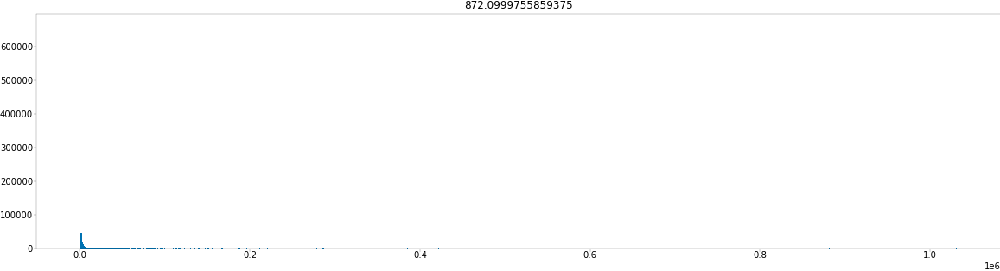

In [66]:
plt.figure(None, (20, 5))
plt.hist(topics.flatten(), bins=1000)
plt.title(np.percentile(topics.flatten(), 85))
plt.show()

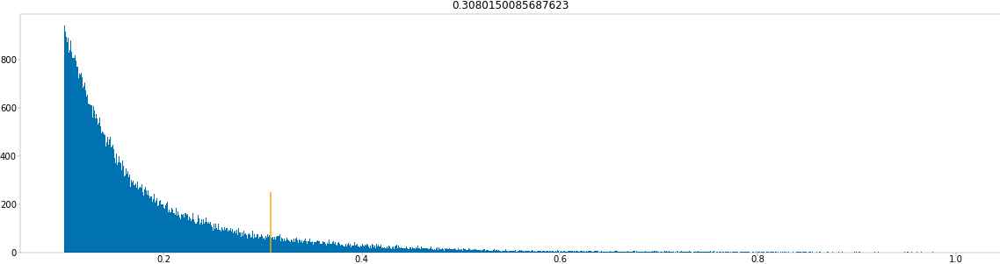

In [67]:
plt.figure(None, (20, 5))
plt.hist(normed_topics.flatten(), bins=1000, range=(0.1, 1))
plt.vlines(np.percentile(normed_topics.flatten(), 99), 0, 250, color='orange')
plt.title(np.percentile(normed_topics.flatten(), 99))
plt.show()

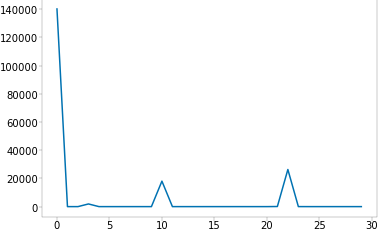

In [402]:
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:

    g = 'WIF1'
    ix_dict = dict(zip(ds.ra.Accession, np.arange(ds.shape[0])))
    ix = np.array([ix_dict.get(x) for x in list(model.vocabs)])
    plt.plot(topics[:, ds.ra.Gene[ix] == g])

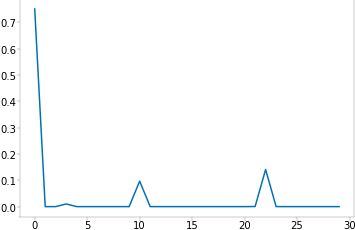

In [403]:
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:

    ix_dict = dict(zip(ds.ra.Accession, np.arange(ds.shape[0])))
    ix = np.array([ix_dict.get(x) for x in list(model.vocabs)])
    plt.plot(normed_topics[:, ds.ra.Gene[ix] == g])

In [117]:
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:
   
    k = topics.shape[0]
    accessions = ds.ra.Accession
    accession_dict = dict(zip(accessions, range(ds.shape[0]))) 
    
    filtered_top_genes = {}
    for n in range(k):
        # only keep genes that are > 100 and > 0.7 normed
        selected = (normed_topics[n] > 0.4) & (topics[n] > 2000) 
        print(selected.sum())
        filtered_topics = topics[n, selected]
        ix = np.array([accession_dict.get(x) for x in list(model.vocabs)])
        filtered_genes = ds.ra.Gene[ix][selected]
        filtered_top_genes[n] = filtered_genes[filtered_topics.argsort()[::-1]]
        

48
3
0
2
4
26
10
2
3
26
11
13
65
204
10
6
3
117
2
0
17
8
10
15
7
7
171
17
8
25



### TOPIC 0 ###



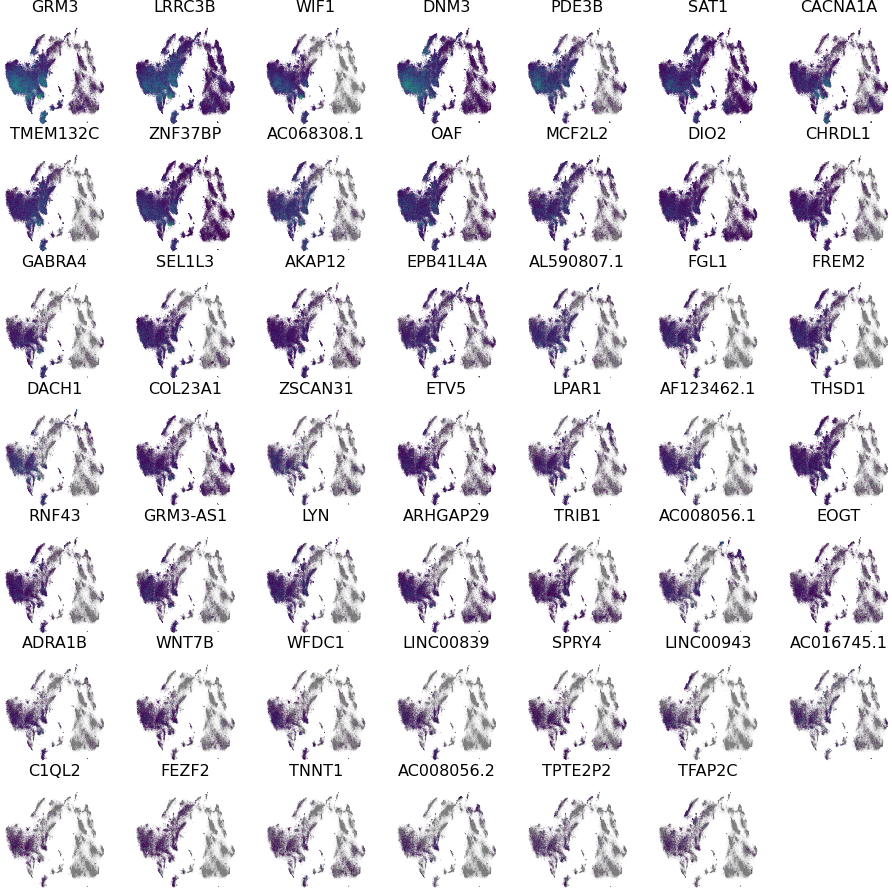


### TOPIC 1 ###



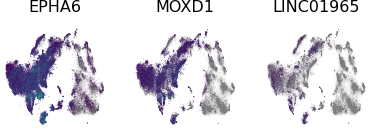


### TOPIC 2 ###



<Figure size 1152x1152 with 0 Axes>


### TOPIC 3 ###



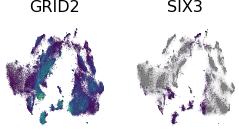


### TOPIC 4 ###



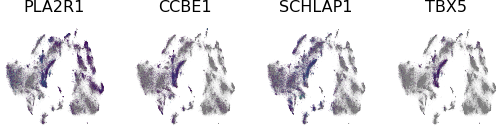


### TOPIC 5 ###



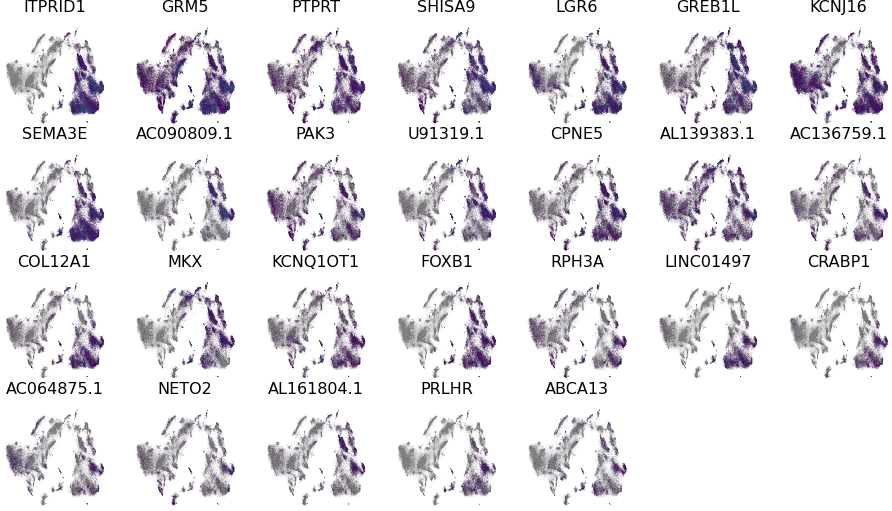


### TOPIC 6 ###



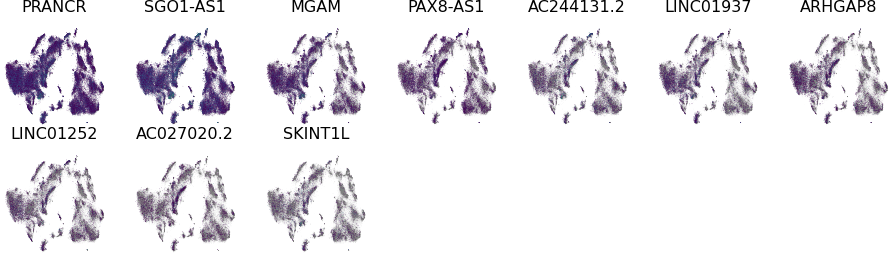


### TOPIC 7 ###



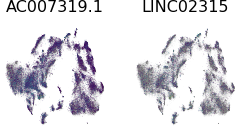


### TOPIC 8 ###



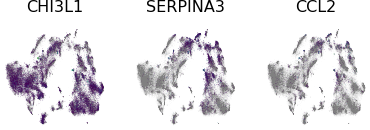


### TOPIC 9 ###



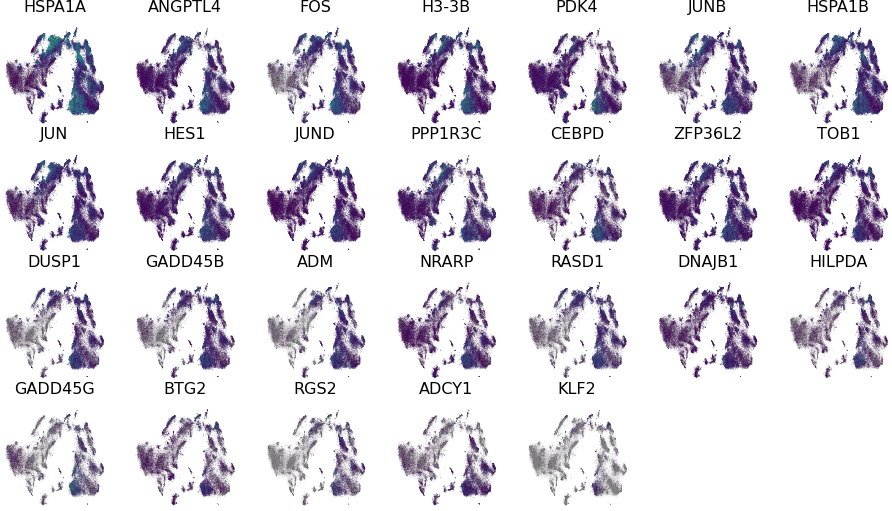


### TOPIC 10 ###



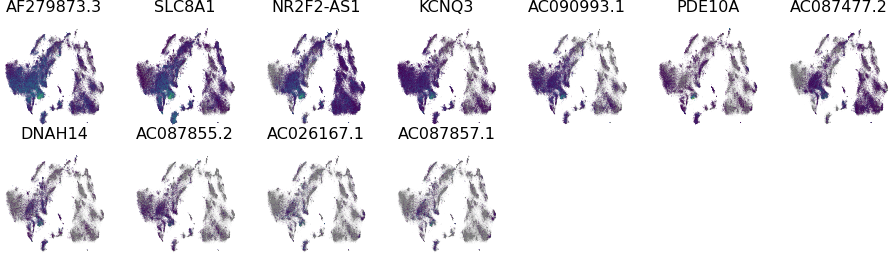


### TOPIC 11 ###



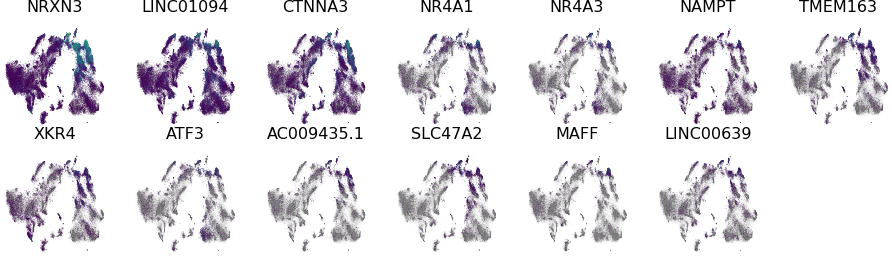


### TOPIC 12 ###



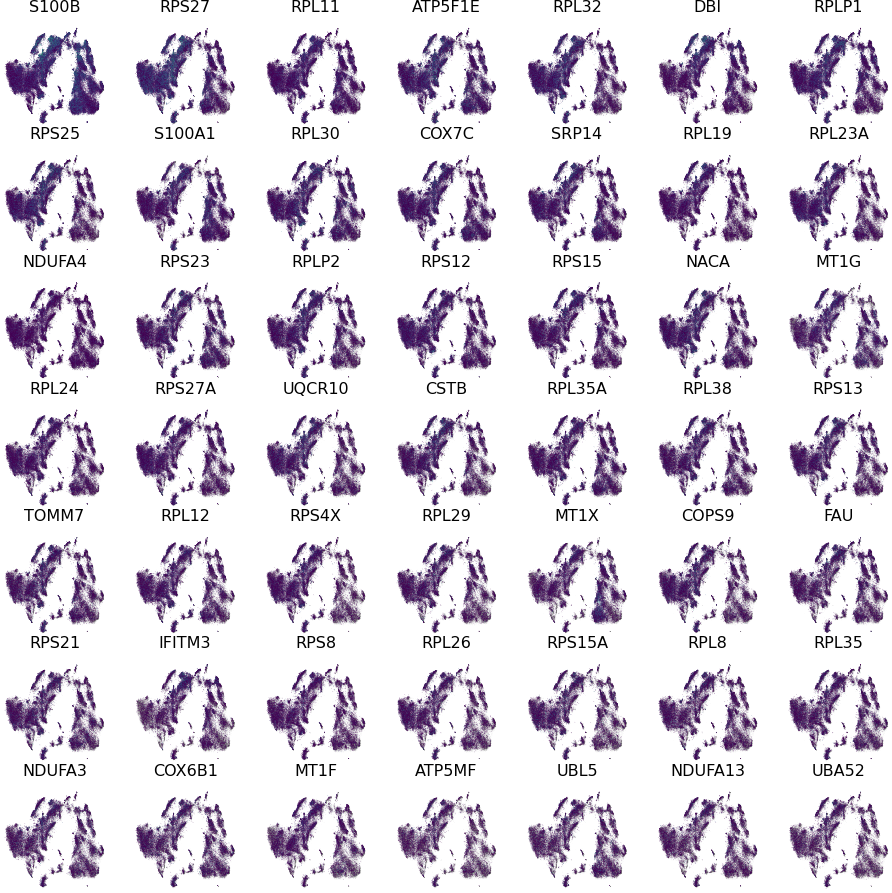


### TOPIC 13 ###



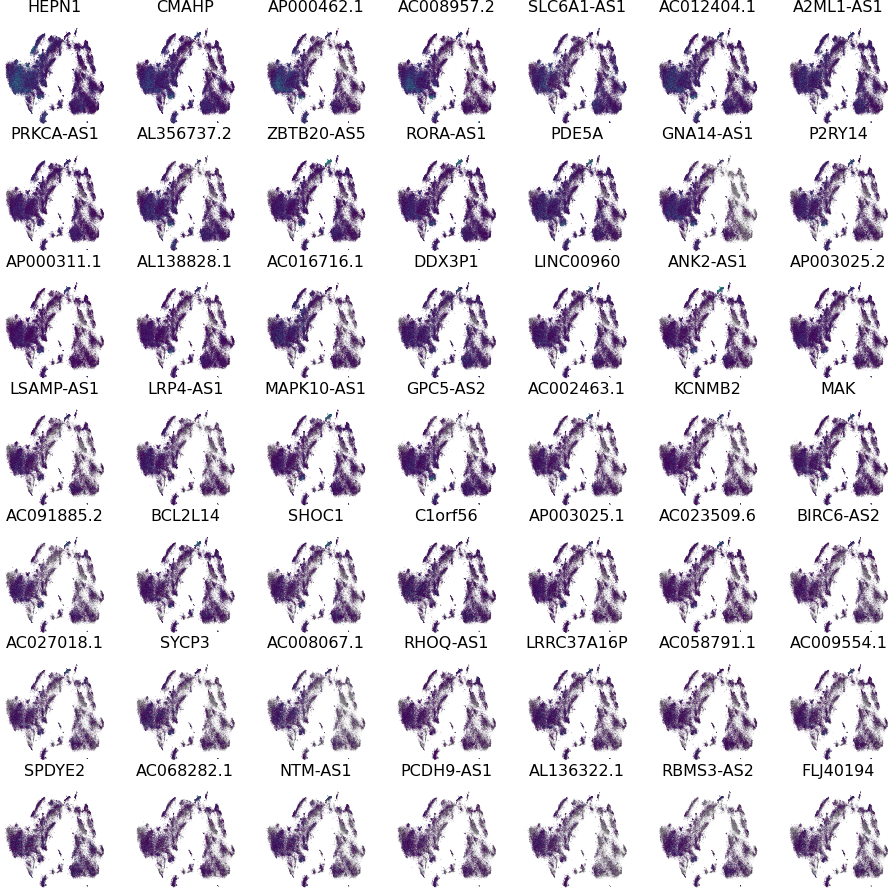


### TOPIC 14 ###



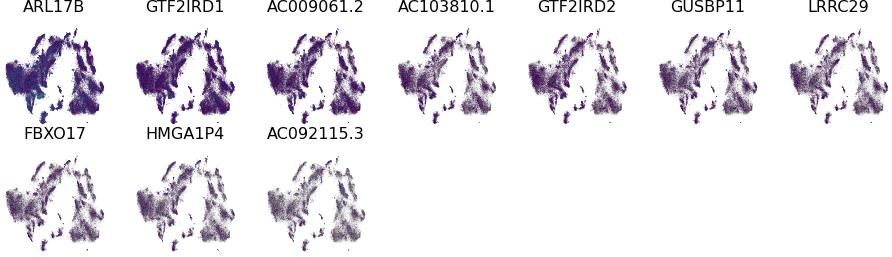


### TOPIC 15 ###



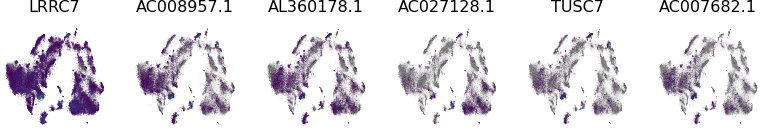


### TOPIC 16 ###



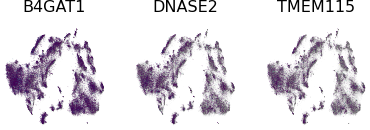


### TOPIC 17 ###



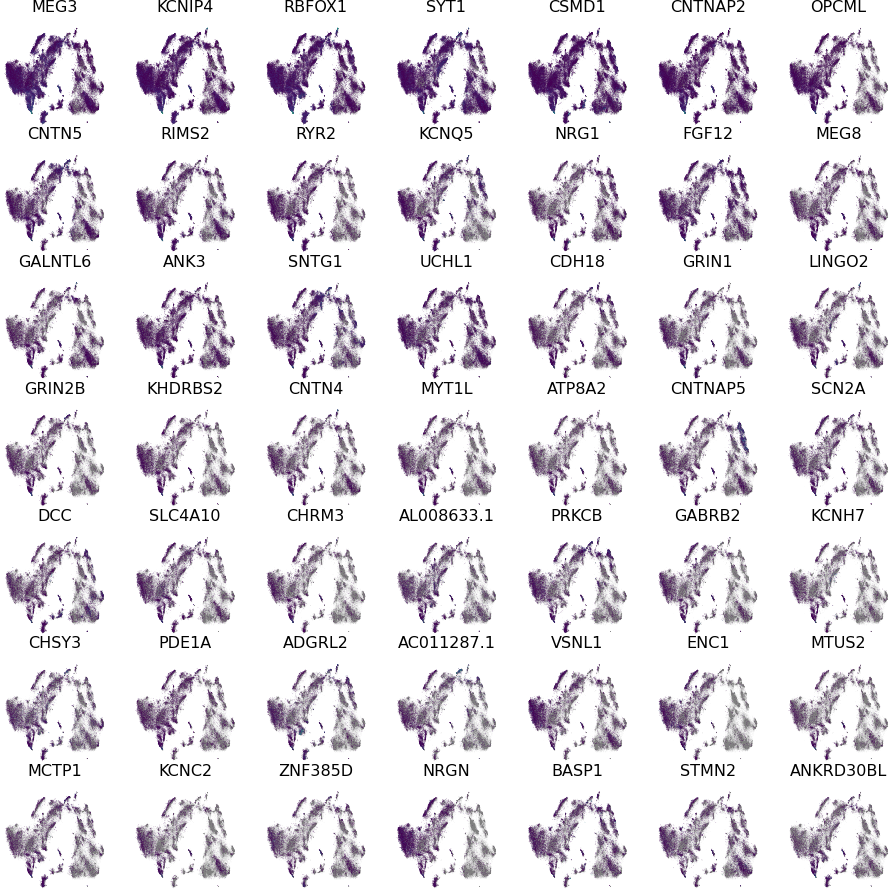


### TOPIC 18 ###



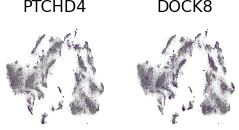


### TOPIC 19 ###



<Figure size 1152x1152 with 0 Axes>


### TOPIC 20 ###



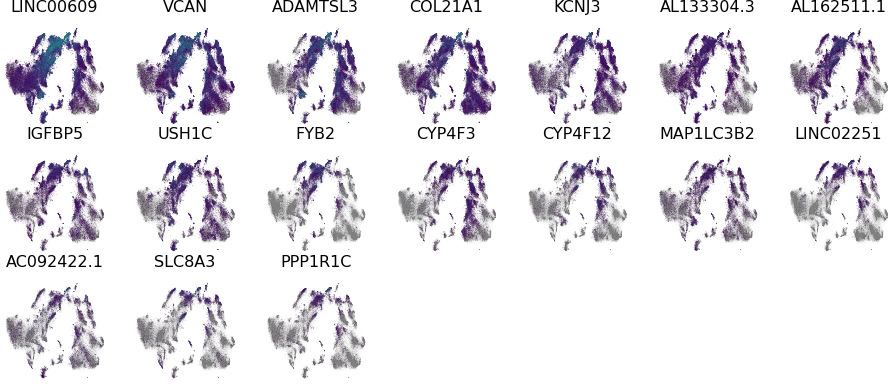


### TOPIC 21 ###



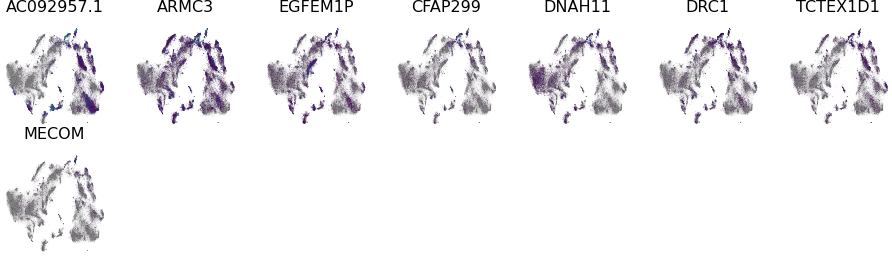


### TOPIC 22 ###



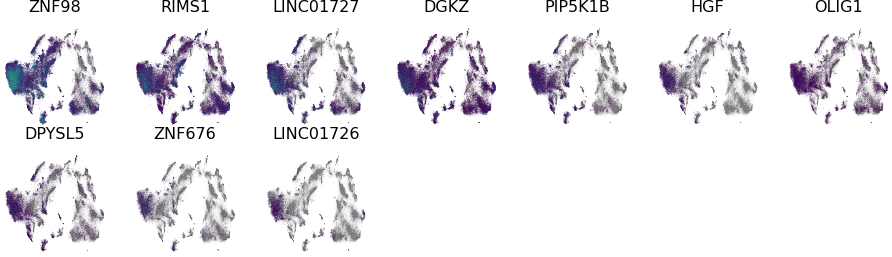


### TOPIC 23 ###



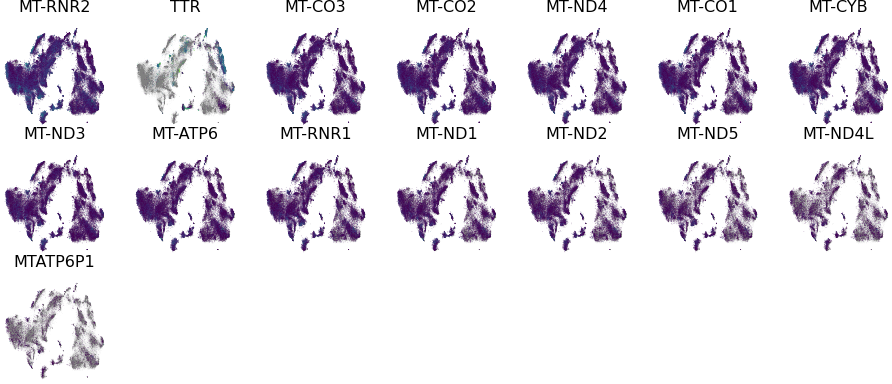


### TOPIC 24 ###



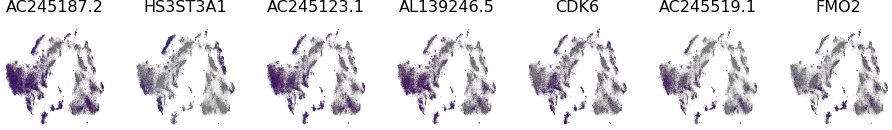


### TOPIC 25 ###



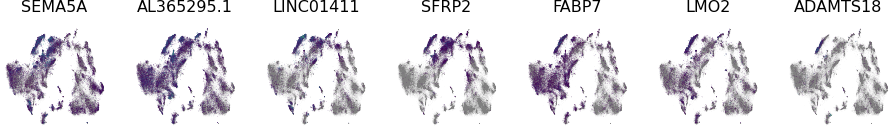


### TOPIC 26 ###



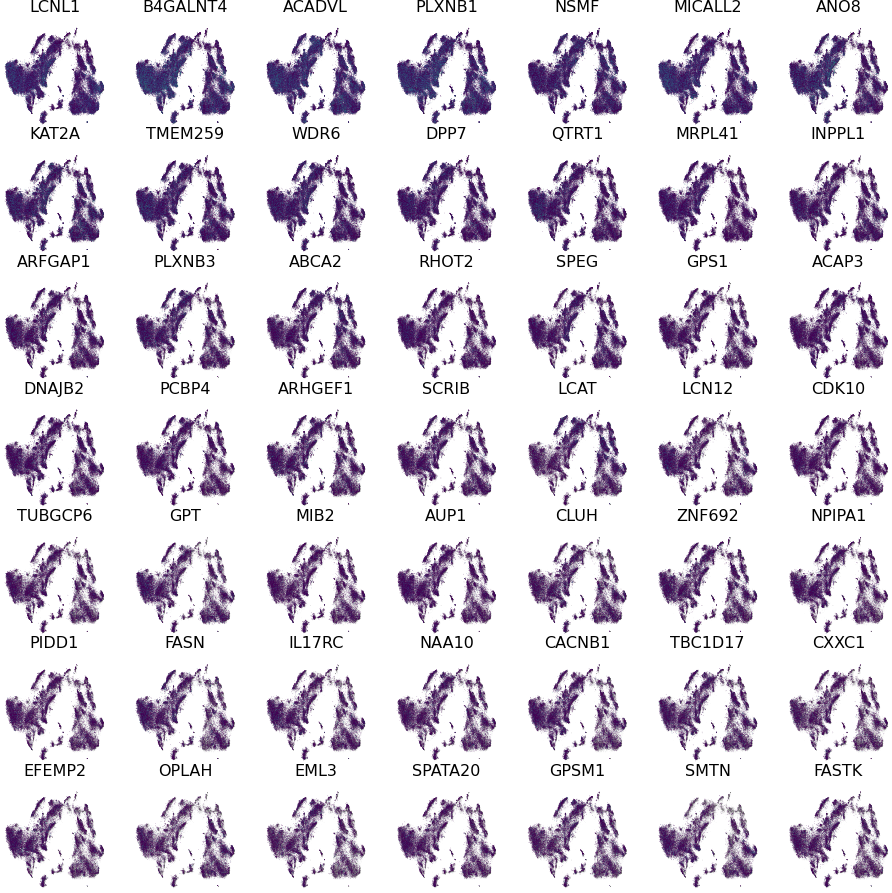


### TOPIC 27 ###



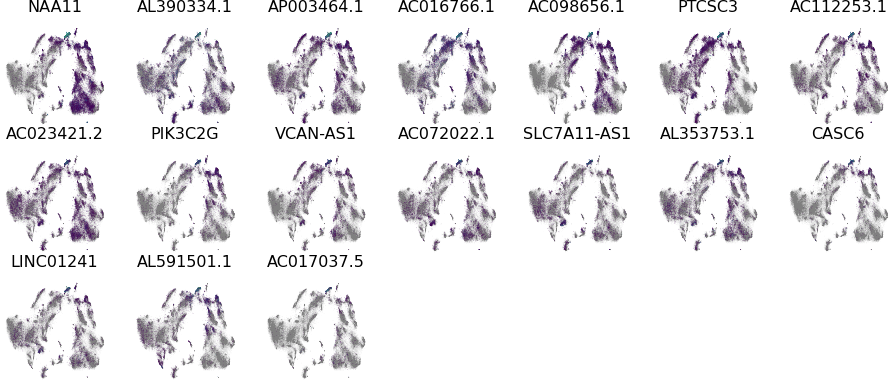


### TOPIC 28 ###



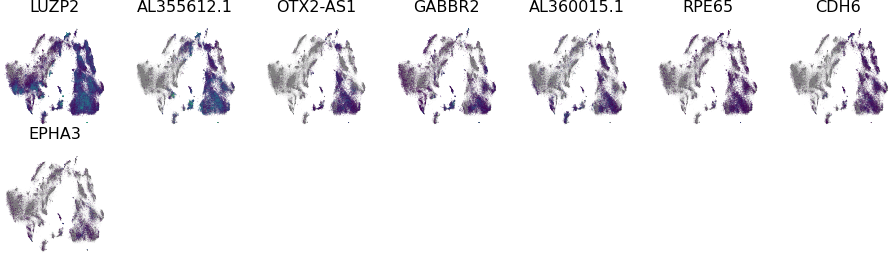


### TOPIC 29 ###



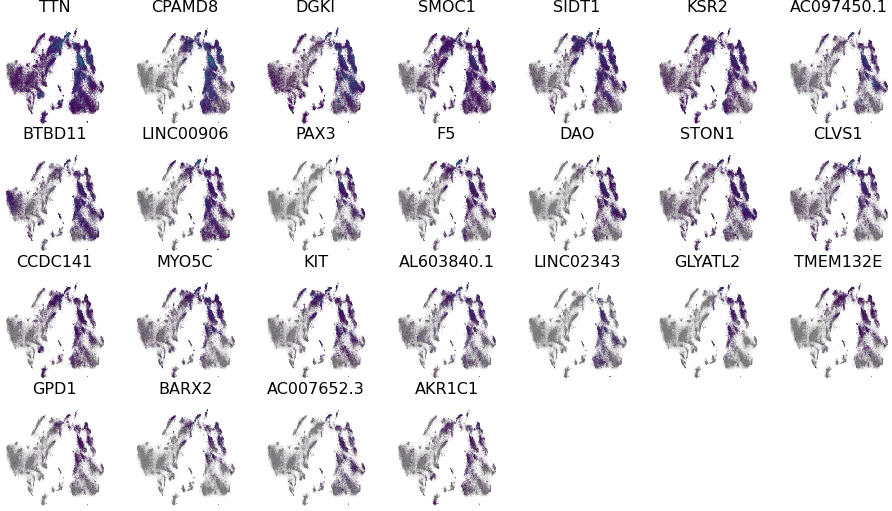

In [118]:
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:

    for n in range(k):
        
        print(f'\n### TOPIC {n} ###\n')
    
        plt.figure(None, (8, 8), dpi=144, facecolor='white')
        gs = plt.GridSpec(7, 7)
    
        to_plot = filtered_top_genes[n][:49]

        for i, g in enumerate(to_plot):
            plt.subplot(gs[i])
            exp = np.log(ds[np.where(ds.ra.Gene == g)[0][0], :].flatten() + 1)
            cells = exp > 0
            plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], color='grey', alpha=0.05, s=0.05, lw=0, rasterized=True)
            plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=exp[cells], s=0.05, lw=0, rasterized=True, cmap='viridis')
            plt.axis('off')
            plt.title(g, fontsize=8)
            plt.margins(0.05, 0.05)
            
        plt.show()

In [127]:
df = gget.enrichr(list(filtered_top_genes[11]) + list(filtered_top_genes[9]), database="ontology")
df[:25]

,rank,path_name,p_val,z_score,combined_score,overlapping_genes,adj_p_val,database
0,1,regulation of cell population proliferation (G...,1.481315e-07,10.021248,157.585789,"[JUN, BTG2, JUND, NR4A3, HILPDA, NAMPT, HES1, ...",0.000075,GO_Biological_Process_2021
1,2,negative regulation of inclusion body assembly...,8.148143e-07,237.547619,3330.490222,"[DNAJB1, HSPA1B, HSPA1A]",0.000105,GO_Biological_Process_2021
2,3,negative regulation of transcription from RNA ...,8.148143e-07,237.547619,3330.490222,"[DNAJB1, JUN, HSPA1A]",0.000105,GO_Biological_Process_2021
3,4,positive regulation of transcription by RNA po...,8.274715e-07,8.349419,116.932700,"[NR4A1, JUN, JUND, NR4A3, MAFF, NAMPT, HES1, F...",0.000105,GO_Biological_Process_2021
4,5,regulation of inclusion body assembly (GO:0090...,1.118862e-06,207.843750,2848.124139,"[DNAJB1, HSPA1B, HSPA1A]",0.000113,GO_Biological_Process_2021
5,6,regulation of cell cycle (GO:0051726),1.485070e-06,14.890138,199.826382,"[NR4A1, JUN, JUND, GADD45B, DUSP1, JUNB, GADD45G]",0.000125,GO_Biological_Process_2021
6,7,"positive regulation of transcription, DNA-temp...",1.067703e-05,6.298117,72.097161,"[NR4A1, JUN, JUND, NR4A3, MAFF, NAMPT, HES1, F...",0.000773,GO_Biological_Process_2021
7,8,chaperone cofactor-dependent protein refolding...,1.727765e-05,72.239130,792.181287,"[DNAJB1, HSPA1B, HSPA1A]",0.001095,GO_Biological_Process_2021
8,9,regulation of transcription from RNA polymeras...,2.445508e-05,27.370740,290.640924,"[DNAJB1, KLF2, ATF3, HSPA1A]",0.001378,GO_Biological_Process_2021
9,10,'de novo' posttranslational protein folding (G...,2.966971e-05,59.324405,618.479701,"[DNAJB1, HSPA1B, HSPA1A]",0.001504,GO_Biological_Process_2021


0


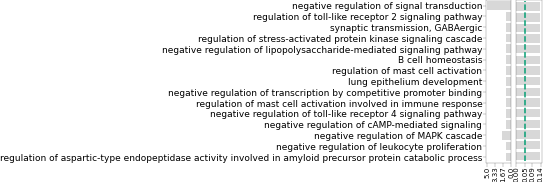

1


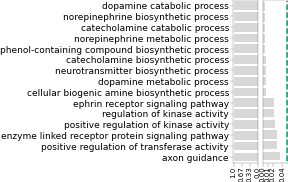

2
3


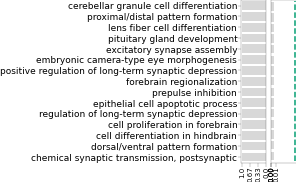

4


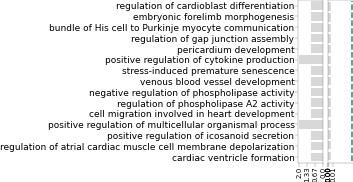

5


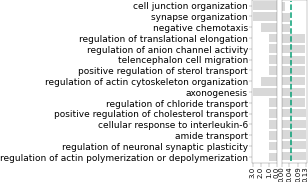

6
7
8


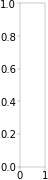

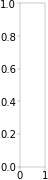

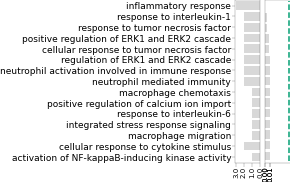

9


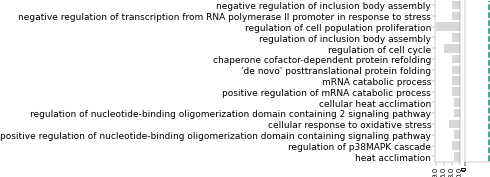

10


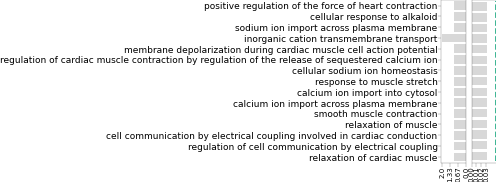

11


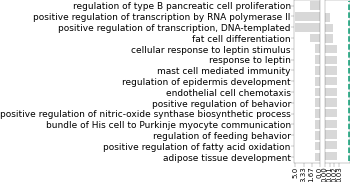

12


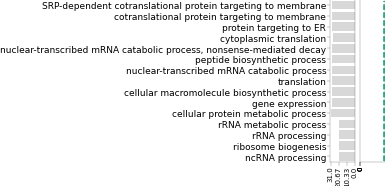

13


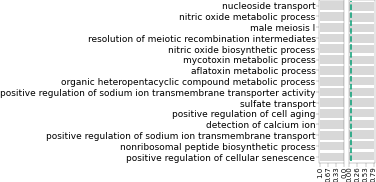

14


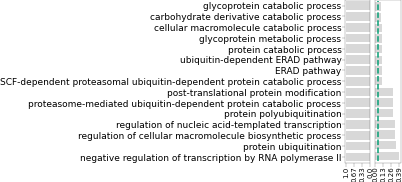

15
16


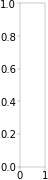

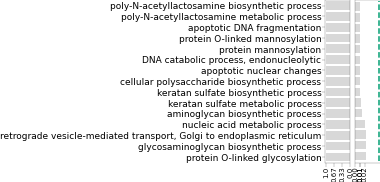

17


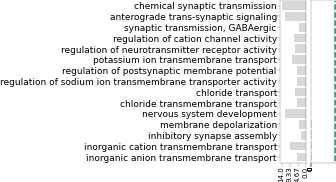

18
19
20


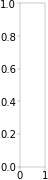

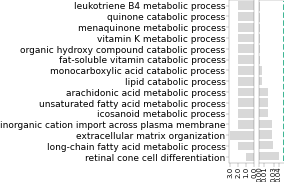

21


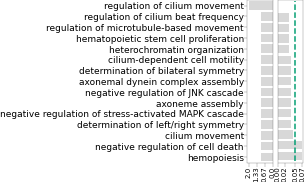

22


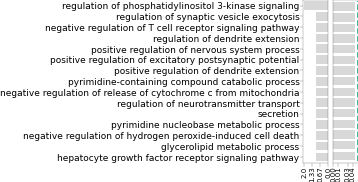

23
24


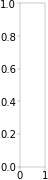

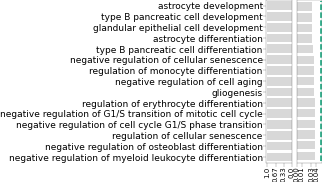

25


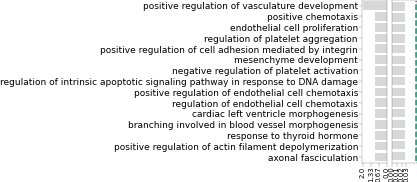

26


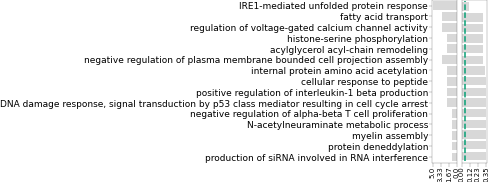

27
28


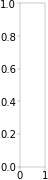

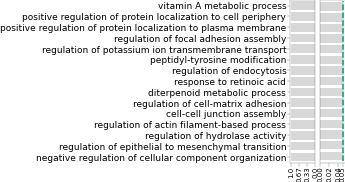

29


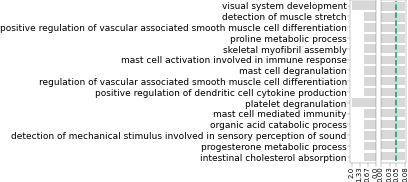

In [78]:
for n in range(30):
    print(n)
    try:
        df = gget.enrichr(filtered_top_genes[n], database="ontology")
        go_plot(df, n_top=15)
    except:
        pass
    

In [81]:
filtered_top_genes[8]

array(['CHI3L1', 'SERPINA3', 'CCL2'], dtype=object)

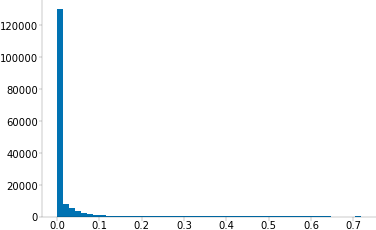

In [84]:
plt.hist(transformed[:, 8], bins=50)
plt.show()

In [150]:
np.percentile(transformed[:, 8], 99)

0.14631518959999246

1551


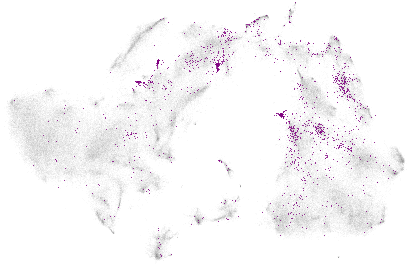

In [153]:
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:

        ix = np.where(ds.ra.Gene == g)[0][0]
        cells = transformed[:, 8] > np.percentile(transformed[:, 8], 99)
        print(cells.sum())
        plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', s=1, alpha=0.05, lw=0, rasterized=True, cmap="viridis")
        plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c='purple', s=1, lw=0, rasterized=True, cmap="viridis")
        plt.margins(0.01, 0.01)
        plt.axis('off')
        
        ax.set_aspect('equal')
        
        plt.tight_layout()
        plt.show()

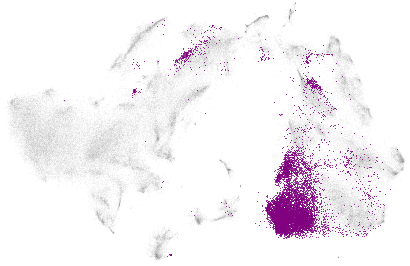

In [144]:
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:

        ix = np.where(ds.ra.Gene == g)[0][0]
        cells = transformed[:, 9] > np.percentile(transformed[:, 8], 99)
        
        plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', s=1, alpha=0.05, lw=0, rasterized=True, cmap="viridis")
        plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c='purple', s=1, lw=0, rasterized=True, cmap="viridis")
        plt.margins(0.01, 0.01)
        plt.axis('off')
        
        ax.set_aspect('equal')
        
        plt.tight_layout()
        plt.show()

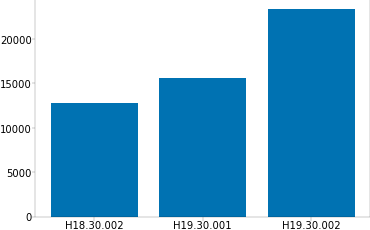

In [139]:
with loompy.connect('/proj/human_adult/20220222/harmony/regions/data/GPe_Clean.loom', 'r') as ds:
    x, counts = np.unique(ds.ca.Donor, return_counts=True)
    plt.bar(x, counts)

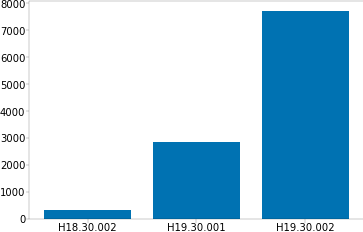

In [145]:
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:

        cells = transformed[:, 9] > np.percentile(transformed[:, 8], 99)
        
        x, counts = np.unique(ds.ca.Donor[cells], return_counts=True)
        plt.bar(x, counts)

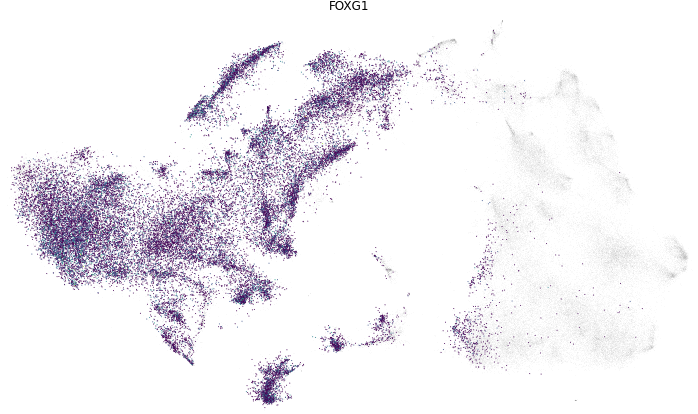

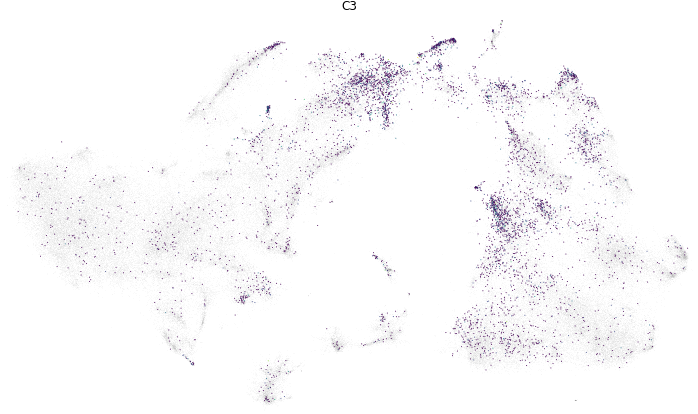

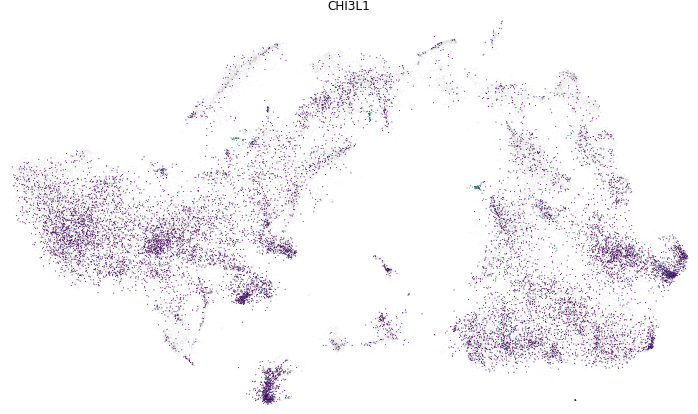

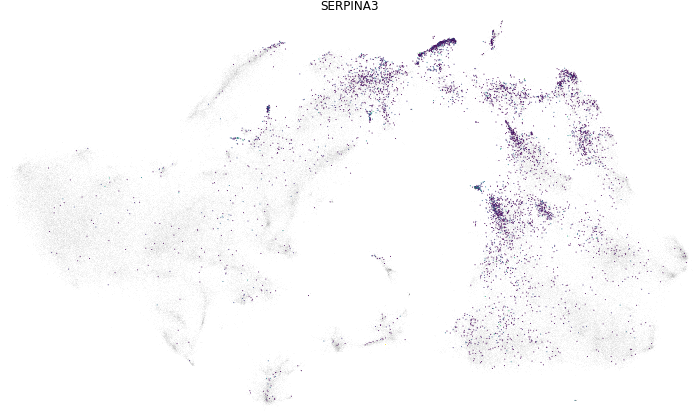

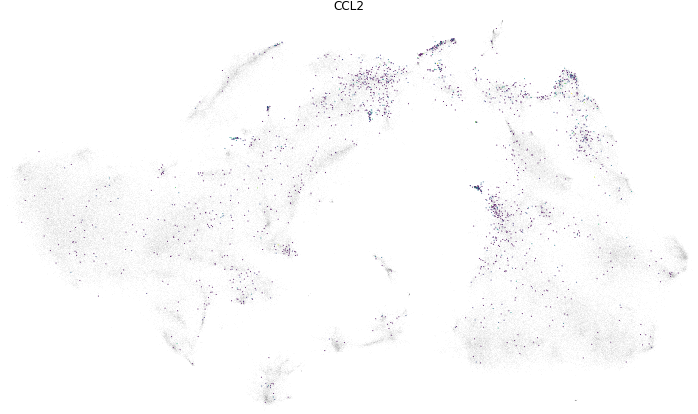

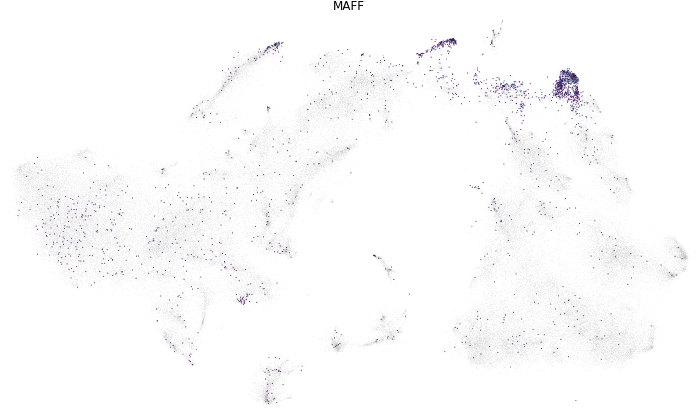

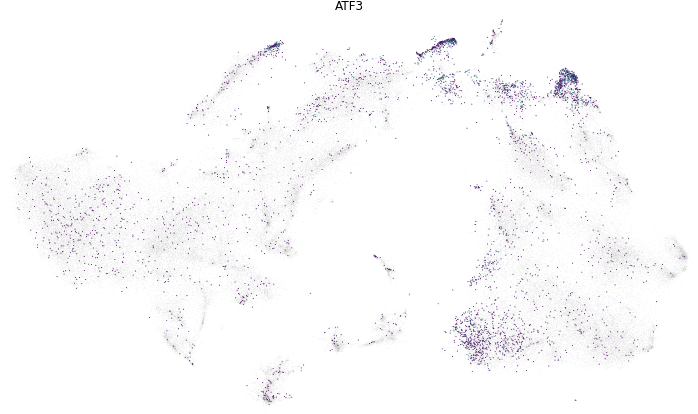

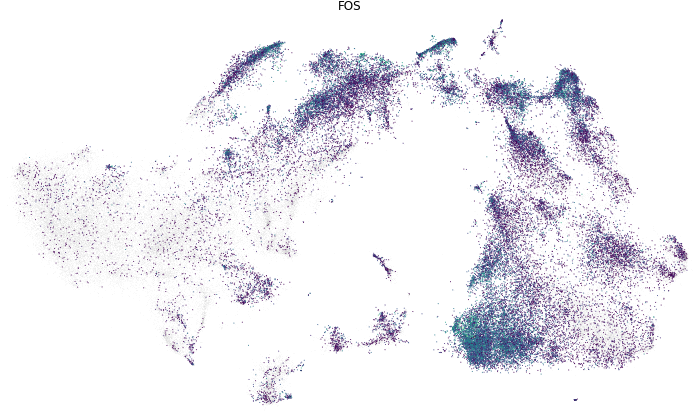

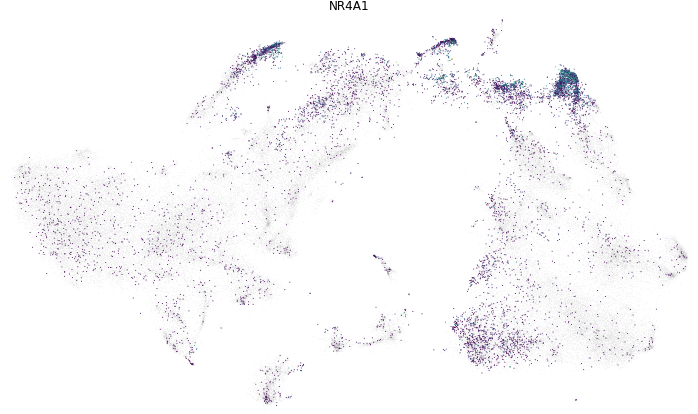

In [146]:
for g in [
    'FOXG1', 'C3', 'CHI3L1', 'SERPINA3', 'CCL2', 'MAFF', 'ATF3', 'FOS', 'NR4A1'
]:

    plt.figure(None, (10, 10))
    ax = plt.subplot(111)

    with loompy.connect('/proj/human_adult/20220222/harmony/paris_top_bug/data/harmony_B_C_Clean.loom', 'r') as ds:

        ix = np.where(ds.ra.Gene == g)[0][0]
        exp = np.log2(ds[ix, :].flatten() + 1)
        cells = exp > 0
        plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', s=1, alpha=0.05, lw=0, rasterized=True, cmap="viridis")
        plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=exp[cells], s=1, lw=0, rasterized=True, cmap="viridis")
        plt.margins(0.01, 0.01)
        plt.axis('off')
        plt.title(g)
        
        ax.set_aspect('equal')
        
        plt.tight_layout()
        plt.show()

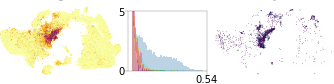

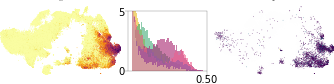

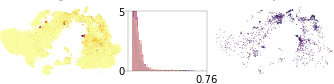

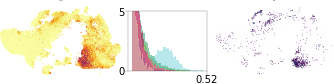

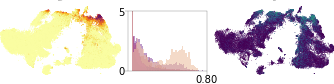

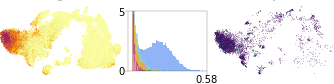

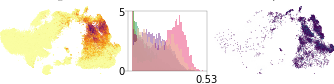

In [177]:
from matplotlib.ticker import FormatStrFormatter

cells = np.loadtxt(f'/proj/human_adult/20220222/harmony/analysis/LDA/astrocytes/{k}/cells.txt').astype('int')

with loompy.connect('/proj/human_adult/20220222/harmony/paris_top_bug/data/Pool.loom', 'r') as ds:
    cell_dict = dict(zip(ds.ca.CellID, ds.ca.ROIGroupCoarse))
    
with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/astrocytes.loom', 'r') as ds:
    
    labels = np.array([cell_dict.get(x) for x in ds.ca.CellID])
    marker_genes = [
        "TBX5", "CRABP1", "CCL2", "FOSB", "CRYAB", "HGF", "DAO"
    ]
    
    for i, n in enumerate([4, 5, 8, 9, 11, 22, 29]):
        
        fig = plt.figure(None, (6, 2))
        ax = plt.subplot(9, 8, (1, 67))
        plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=transformed[:, n], s=0.5, lw=0, rasterized=True, cmap='inferno_r')
        plt.margins(0, 0)
        plt.axis('off')
        plt.title(f'Topic {n}', fontsize=0.5)
        
        ax.set_aspect('equal')
        
        ax = plt.subplot(9, 8, (20, 53))
        # ax = plt.subplot(9, 5, (13, 33))
        for j, r in enumerate(list(color_dict.keys())):
            vals = transformed[:, n][labels[cells] == r].flatten()
            plt.hist(vals, bins=50, alpha=0.6, density=True, color=color_dict[r])
        plt.ylim(0, 5)
        plt.yticks([0, 5])
        plt.xticks([ax.get_xlim()[1]])
        ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    
        ax = plt.subplot(9, 8, (6, 72))
        # ax = plt.subplot(9, 5, (4, 45))
        g = marker_genes[i]
        ix = np.where(ds.ra.Gene == g)[0][0]
        exp = np.log2(ds[ix, :].flatten() + 1)
        exp_cells = exp > 0
        plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', s=0.4, alpha=0.01, lw=0, rasterized=True)
        plt.scatter(ds.ca.TSNE[exp_cells, 0], ds.ca.TSNE[exp_cells, 1], c=exp[exp_cells], s=0.4, lw=0, rasterized=True, cmap="viridis")
        plt.margins(0, 0)
        plt.axis('off')
        plt.title(g, fontsize=0.5)
        
        ax.set_aspect('equal')
        
        plt.tight_layout()
                
        plt.savefig(f'/home/kimberly/figures/figure6/topic{n}.pdf', dpi=300)

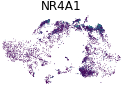

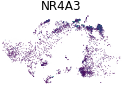

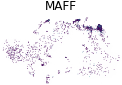

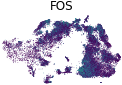

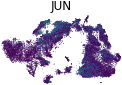

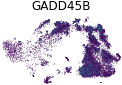

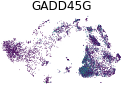

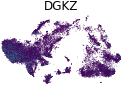

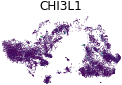

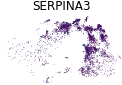

In [178]:
for g in [
    'NR4A1', 'MAFF', 'FOS', 'JUN', 'GADD45G', 'CHI3L1', 'SERPINA3'
]:

    plt.figure(None, (2, 2))
    ax = plt.subplot(111)

    with loompy.connect('/proj/human_adult/20220222/harmony/paris_top_bug/data/harmony_B_C_Clean.loom', 'r') as ds:

        ix = np.where(ds.ra.Gene == g)[0][0]
        exp = np.log2(ds[ix, :].flatten() + 1)
        cells = exp > 0
        plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', s=0.4, alpha=0.01, lw=0, rasterized=True, cmap="viridis")
        plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=exp[cells], s=0.4, lw=0, rasterized=True, cmap="viridis")
        plt.margins(0.01, 0.01)
        plt.axis('off')
        plt.title(g)
        
        ax.set_aspect('equal')
        
        plt.tight_layout()
        plt.savefig(f'/home/kimberly/figures/figure6/topic_{g}.pdf', dpi=300)